## Advanced Lane Finding Project

The goals / steps of this project are the following:

1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
2. Apply a distortion correction to raw images.
3. Use color transforms, gradients, etc., to create a thresholded binary image.
4. Apply a perspective transform to rectify binary image ("birds-eye view").
5. Detect lane pixels and fit to find the lane boundary.
6. Determine the curvature of the lane and vehicle position with respect to center.
7. Warp the detected lane boundaries back onto the original image.
8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---

## 0. Parameters and Imports

In [57]:
CALCULATE_CALIBRATION_MODE = False
CALCULATE_THRESHOLDS = False
CALIBRATION_FILE = "calibration_pickle.p"

In [58]:
import numpy as np
import cv2
import os, fnmatch
import matplotlib.pyplot as plt
import pickle
#%matplotlib qt
%matplotlib inline

## 1. Camera calibration matrix and distortion coefficients given a set of chessboards.

In [59]:
def cal_undistort(img, pickle_switch=True, objpoints=None, imgpoints=None):
    #Read pickle-file
    if pickle_switch:
        with open(CALIBRATION_FILE, 'rb') as handle:
            pickle_dump = pickle.load(handle)
        objpoints = pickle_dump["objpoints"]
        imgpoints = pickle_dump["imgpoints"]
        
    img_size = (img.shape[1], img.shape[0])
    # Use cv2.calibrateCamera and cv2.undistort()
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    img = cv2.undistort(img, mtx, dist, None, mtx)
    undist = np.copy(img)  # Delete this line
    return undist

In [60]:
if CALCULATE_CALIBRATION_MODE:
    #prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((6*9,3), np.float32)
    objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

    #Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    # Load Chessboard Images
    PATH = 'camera_cal/'
    num_images = len(os.listdir(PATH))
    f, ax = plt.subplots(num_images, 3, figsize=(30,140))
    i = 0

    # Calculate chessboard parameters
    for fname in sorted(os.listdir(PATH)):
        img = cv2.imread(PATH+fname)

        #print(fname)
        #print(img)
        # Convert to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

        ax[i][0].set_title("{} - Original Image".format(PATH+fname),fontsize='xx-large')
        ax[i][1].set_title("{} - Image with corners".format(PATH+fname),fontsize='xx-large')

        # If found, add object points, image points
        if ret == True:
            ax[i][0].imshow(img)
            # Draw and display the corners
            cv2.drawChessboardCorners(img, (9,6), corners, ret)
            #plt.imshow(img)
            ax[i][1].imshow(img)

            objpoints.append(objp)
            imgpoints.append(corners)
        else:
            img = cv2.imread(PATH+"calibration_fail.jpg")
            ax[i][0].imshow(img)
            ax[i][1].imshow(img)

        i+=1 

    # Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
    dist_pickle = {}
    dist_pickle["objpoints"] = objpoints
    dist_pickle["imgpoints"] = imgpoints
    with open(CALIBRATION_FILE, 'wb') as handle:
        pickle.dump(dist_pickle, handle)

    #Compute Undistorted Chessboard Images 
    i=0
    for fname in sorted(os.listdir(PATH)):
        img = cv2.imread(PATH+fname)
        undistorted = cal_undistort(img, False, objpoints, imgpoints)
        ax[i][2].set_title("{} - Undistorted".format(PATH+fname),fontsize='xx-large')
        ax[i][2].imshow(undistorted)
        i+=1
    
    # Plot 1) Original 2) Corner 3)Undistorted
    plt.plot()

In [61]:
#Test for Calibration using pickle file
if CALCULATE_CALIBRATION_MODE:
    fname= "calibration2.jpg"
    img = cv2.imread(PATH+fname)
    undistorted = cal_undistort(img, pickle_switch=True)
    plt.imshow(undistorted)

## 2. Apply a distortion correction to raw images.

0
straight_lines1.jpg
Saving file in test_images/undistorted/straight_lines1.jpg
1
straight_lines2.jpg
Saving file in test_images/undistorted/straight_lines2.jpg
2
test1.jpg
Saving file in test_images/undistorted/test1.jpg
3
test2.jpg
Saving file in test_images/undistorted/test2.jpg
4
test3.jpg
Saving file in test_images/undistorted/test3.jpg
5
test4.jpg
Saving file in test_images/undistorted/test4.jpg
6
test5.jpg
Saving file in test_images/undistorted/test5.jpg
7
test6.jpg
Saving file in test_images/undistorted/test6.jpg


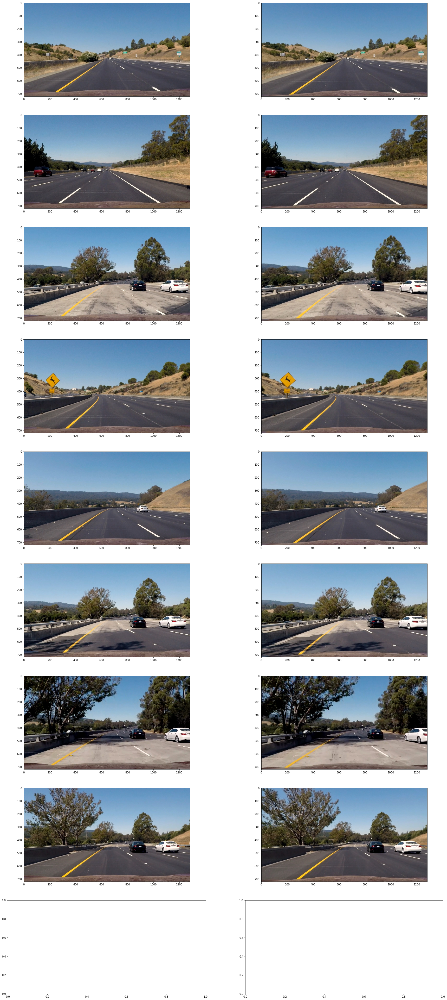

In [62]:
PATH = 'test_images/'

num_images = len(os.listdir(PATH))
f, ax = plt.subplots(num_images, 2, figsize=(30,70))
i=0

for fname in sorted(fnmatch.filter(os.listdir(PATH), '*.jpg')):       
    print(i)
    print(fname)
    img = cv2.imread(PATH+fname)
    ax[i][0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    undistorted = cal_undistort(img, pickle_switch=True)
    #Save undistorted images
    print("Saving file in {}".format(PATH+'undistorted/'+fname))
    
    cv2.imwrite(PATH+'undistorted/'+fname,undistorted)
    ax[i][1].imshow(cv2.cvtColor(undistorted, cv2.COLOR_BGR2RGB))
    i+=1
    1
if CALCULATE_CALIBRATION_MODE:
    plt.plot()

## 3. Use color transforms, gradients, etc., to create a thresholded binary image.

In [63]:
# Define a function that takes an image, gradient orientation,
# and threshold min / max values.
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Return the result
    return binary_output

In [64]:
# Define a function to return the magnitude of the gradient
# for a given sobel kernel size and threshold values
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output


In [65]:
# Define a function to threshold an image for a given range and Sobel kernel
#thresh = (0.7, 1.3),
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

In [66]:
# Define a function that thresholds the S-channel of HLS
def hls_select(img, thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    return binary_output

In [67]:
#Apply different techniques and combine
def thresholded_binary(img):
    #grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    #apply different techniques
    gradx = abs_sobel_thresh(img, orient='x', thresh_min=20, thresh_max=100)
    grady = abs_sobel_thresh(img, orient='y', thresh_min=20, thresh_max=100)
    mag_binary = mag_thresh(img, sobel_kernel=3, mag_thresh=(30, 120))
    dir_binary = dir_threshold(img, sobel_kernel=15, thresh=(0.7, 1.3))
    hls_binary = hls_select(img, thresh=(180, 255))   
    
    #combine
    combined = np.zeros_like(dir_binary)
    combined[(((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))) | (hls_binary == 1)] = 1  
    
    return combined

In [68]:
if CALCULATE_THRESHOLDS:
    PATH = 'test_images/'
    num_images = len(os.listdir(PATH))
    f, ax = plt.subplots(num_images, 2, figsize=(30,70))
    i=0
    for fname in sorted(fnmatch.filter(os.listdir(PATH), '*.jpg')):         
        #read and show
        img = cv2.imread(PATH+"undistorted/"+fname)
        ax[i][0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

        combined = thresholded_binary(img)

        #save combined
        cv2.imwrite(PATH+'combine/'+fname,combined)
        #show combined image
        ax[i][1].imshow(combined, cmap='gray')
        i+=1

    plt.plot()

## Apply a perspective transform to rectify binary image ("birds-eye view").

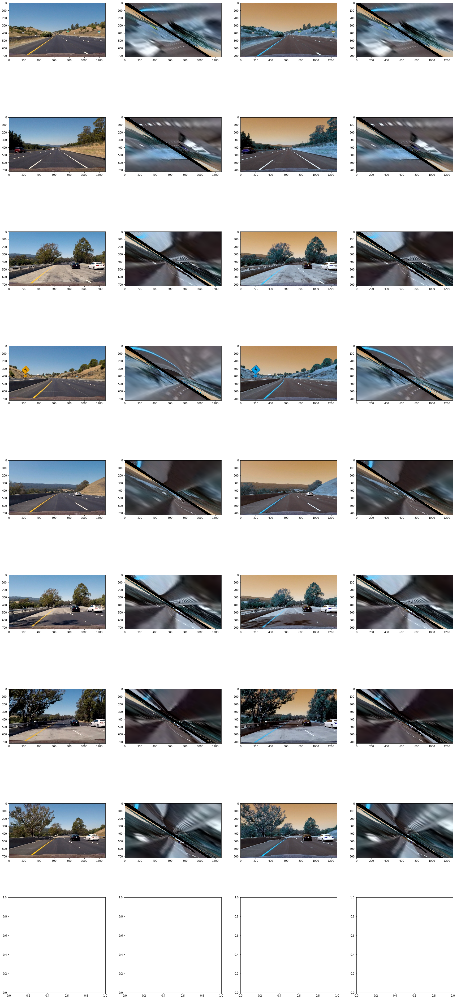

In [69]:
num_images = len(os.listdir(PATH))

f, ax = plt.subplots(num_images, 4, figsize=(30,70))
i=0
for fname in sorted(fnmatch.filter(os.listdir(PATH), '*.jpg')):          
    #read and show
    img = cv2.imread(PATH+fname)
    ax[i][0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    
    img_size = (img.shape[1], img.shape[0])
    src = np.float32([[300,660],[623,429],[656,429],[1012,660]])
    dst = np.float32([[200,100],[1200,100],[200,800],[1200,800]])
    
    M = cv2.getPerspectiveTransform(src, dst)
    
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    #show combined image
    ax[i][1].imshow(warped, cmap='gray')
    
    #warp undistorted
    img = cv2.imread(PATH+'undistorted/'+fname)
    ax[i][2].imshow(img, cmap='gray')
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    ax[i][3].imshow(warped, cmap='gray')
    i+=1

#invertieren -> Minv = cv2.getPerspectiveTransform(dst, src)
